## 1. Manipulação Inicial do Dataset

### 1.1. Importação de Bibliotecas e Leitura de arquivo .json

#### O arquivo .json conterá todoas as informações de todos os isoladores. Assim, cada imagem será representada por um isolador, e cada imagem apresentará informações acerca de cada um dos discos presentes no isolador. Abaixo, é mostrado um exemplo de como os dados são representados no arquivo .json. A imagem abaixo está disponível no manual do dataset

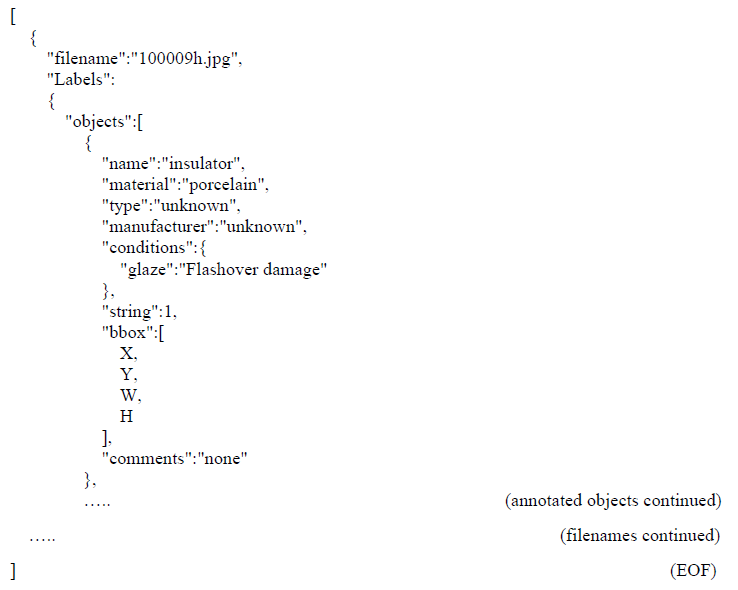

In [215]:
# Importacao de Bibliotecas

from matplotlib import patches
from PIL import Image
from IPython.display import display
import json
import requests
import pandas as pd
import matplotlib.pyplot as plt

In [125]:
# Caminho do arquivo
caminho_arquivo = r"C:\Projetos\TCC\1-Datasets\1-IEEE-Insulators\labels_v1.2.json"
print(caminho_arquivo)

C:\Projetos\TCC\1-Datasets\1-IEEE-Insulators\labels_v1.2.json


### 1.2. Manipulações Iniciais do Arquivo .json

#### Manipulação do arquivo visando o entendimento de como as informações estão dispostas, bem como podem ser acessadas.

In [23]:
# Abre o arquivo para leitura
with open(caminho_arquivo, 'r') as arquivo:
    dados = json.load(arquivo)

In [26]:
df = pd.read_json(caminho_arquivo)

In [27]:
print(df.head())

      filename                                             Labels
0   100228.JPG  {'objects': [{'name': 'insulator', 'material':...
1  100228h.JPG  {'objects': [{'name': 'insulator', 'material':...
2  100228v.JPG  {'objects': [{'name': 'insulator', 'material':...
3  100228d.JPG  {'objects': [{'name': 'insulator', 'material':...
4   130064.jpg  {'objects': [{'name': 'insulator', 'material':...


In [48]:
for i, row in df.head(1).iterrows():
    print(f"filename: {row['filename']}")
    print(f"{row['Labels']}")
    print('\n')

filename: 100228.JPG
{'objects': [{'name': 'insulator', 'material': 'porcelain', 'type': 'unknown', 'manufacturer': 'unknown', 'conditions': {'No issues': 'No issues'}, 'string': 0, 'bbox': [1504, 399, 1104, 653], 'comments': 'none'}, {'name': 'insulator', 'material': 'porcelain', 'type': 'unknown', 'manufacturer': 'unknown', 'conditions': {'shell': 'Broken'}, 'string': 0, 'bbox': [1471, 810, 1109, 606], 'comments': 'none'}, {'name': 'insulator', 'material': 'porcelain', 'type': 'unknown', 'manufacturer': 'unknown', 'string': 1, 'bbox': [1434, 1, 1222, 1613], 'comments': 'none'}, {'name': 'insulator', 'material': 'porcelain', 'type': 'unknown', 'manufacturer': 'unknown', 'conditions': {'No issues': 'No issues'}, 'string': 0, 'bbox': [1556, 0, 1105, 591], 'comments': 'none'}]}




In [53]:
df.iloc[210]['filename']

'160693v.JPG'

In [54]:
for objeto in df.iloc[210]['Labels']['objects']:
    if 'conditions' in objeto:
        print(f"Conditions: {objeto['conditions']}")
    else:
        print("Não encontrado")

Conditions: {'No issues': 'No issues'}
Conditions: {'glaze': 'Flashover damage'}
Conditions: {'glaze': 'Flashover damage'}
Conditions: {'glaze': 'Flashover damage'}
Conditions: {'glaze': 'Flashover damage'}
Não encontrado
Conditions: {'glaze': 'Flashover damage'}
Conditions: {'glaze': 'Flashover damage'}


In [60]:
isoladores_danificados = 0
isoladores_intactos = 0

# Iterando sobre os dez primeiros filenames
for isolador in range (200):
    nome_arquivo = df.iloc[isolador]
    print(f"Filename: {nome_arquivo['filename']}")
    
    #Checagem de todos os "discos de cada isolador"
    for objeto in nome_arquivo['Labels']['objects']:
        if 'conditions' in objeto:
            print(f"Conditions: {objeto['conditions']}")
        elif 'conditions' not in objeto:
            print("Condição não encontrada")
        else:
            print("Sei la o que deu")
    print("\n")

Filename: 100228.JPG
Conditions: {'No issues': 'No issues'}
Conditions: {'shell': 'Broken'}
Condição não encontrada
Conditions: {'No issues': 'No issues'}


Filename: 100228h.JPG
Conditions: {'No issues': 'No issues'}
Conditions: {'shell': 'Broken'}
Condição não encontrada
Conditions: {'No issues': 'No issues'}


Filename: 100228v.JPG
Conditions: {'No issues': 'No issues'}
Conditions: {'shell': 'Broken'}
Condição não encontrada
Conditions: {'No issues': 'No issues'}


Filename: 100228d.JPG
Conditions: {'No issues': 'No issues'}
Conditions: {'shell': 'Broken'}
Condição não encontrada
Conditions: {'No issues': 'No issues'}


Filename: 130064.jpg
Conditions: {'No issues': 'No issues'}
Conditions: {'No issues': 'No issues'}
Conditions: {'No issues': 'No issues'}
Conditions: {'shell': 'Broken'}
Condição não encontrada
Conditions: {'No issues': 'No issues'}
Conditions: {'No issues': 'No issues'}
Conditions: {'No issues': 'No issues'}
Conditions: {'No issues': 'No issues'}
Conditions: {'No is

### 1.3. Contagem de Isoladores completamente intactos:

#### Checagem dos isoladores que não apresentam nenhum dano em qualquer um dos seus pratos.

In [92]:
contador_isoladores = 0

contador_isoladores_danificados = 0
contador_isoladores_intactos = 0

contador_danos = 0

# Iterando sobre os dez primeiros filenames
for isolador, nome_arquivo in df.iterrows():
    nome_arquivo = df.iloc[isolador]
    
    contador_isoladores += 1
    
    #Checagem de todos os "discos de cada isolador"
    for objeto in nome_arquivo['Labels']['objects']:
        # Foi encontrada informacao sobre o disco analisado do isolador e o disco apresenta algum dano
        if ('conditions' in objeto) and (objeto['conditions'] != {"No issues": "No issues"}) and (objeto['conditions'] != {'notbroken-notflashed': 'notbroken-notflashed'}):
            contador_danos += 1
            
    #print(f"Número de danos encontrados: {contador_danos}")     
    #print("\n")
    
    if contador_danos == 0:
        print(f"Isolador: {nome_arquivo['filename']} \t Número de danos encontrados: {contador_danos}")
        contador_isoladores_intactos += 1
    else:
        contador_isoladores_danificados += 1
    contador_danos = 0

print("\n\n")
print(f"Isoladores Intactos: {contador_isoladores_intactos}")
print(f"Isoladores Danificados: {contador_isoladores_danificados}")
print(f"Total de Isoladores: {contador_isoladores}")

Isolador: 161283.JPG 	 Número de danos encontrados: 0
Isolador: 161283h.JPG 	 Número de danos encontrados: 0
Isolador: 161283v.JPG 	 Número de danos encontrados: 0
Isolador: 161283d.JPG 	 Número de danos encontrados: 0
Isolador: 161234.JPG 	 Número de danos encontrados: 0
Isolador: 161234h.JPG 	 Número de danos encontrados: 0
Isolador: 161234v.JPG 	 Número de danos encontrados: 0
Isolador: 161234d.JPG 	 Número de danos encontrados: 0
Isolador: 160437.JPG 	 Número de danos encontrados: 0
Isolador: 160437h.JPG 	 Número de danos encontrados: 0
Isolador: 160437v.JPG 	 Número de danos encontrados: 0
Isolador: 160437d.JPG 	 Número de danos encontrados: 0
Isolador: 160782.JPG 	 Número de danos encontrados: 0
Isolador: 160782h.JPG 	 Número de danos encontrados: 0
Isolador: 160782v.JPG 	 Número de danos encontrados: 0
Isolador: 160782d.JPG 	 Número de danos encontrados: 0



Isoladores Intactos: 16
Isoladores Danificados: 1584
Total de Isoladores: 1600


### 1.4. Avaliação de todos os pratos

#### Checagem do número absoluto de pratos presentes em todos os isolados do conjunto treinamento. No final desta seção é apresentado um gráfico em forma de pizza a respeito dos possíveis estados dos isoladores.

In [94]:
contador_intacto = 0
contador_no_info = 0
contador_quebrado = 0
contador_descarga_eletrica = 0

contador_resto = 0 # Serão somados com contador_intacto, estão classificados como {'notbroken-notflashed': 'notbroken-notflashed'}

contador_pratos = 0

# Iterando sobre os todos os isoladores
for isolador, nome_arquivo in df.iterrows():
    nome_arquivo = df.iloc[isolador]
    
    #Checagem de todos os discos de cada isolador
    for objeto in nome_arquivo['Labels']['objects']:
        contador_pratos += 1
        
        # Foi encontrada informacao sobre o disco analisado do isolador
        if 'conditions' in objeto:
            if objeto['conditions'] == {"No issues": "No issues"}:
                contador_intacto += 1
            elif objeto['conditions'] == {'shell': 'Broken'}:
                contador_quebrado += 1
            elif objeto['conditions'] == {'glaze': 'Flashover damage'}:
                contador_descarga_eletrica += 1
            else:
                contador_resto += 1
        # Não foi encontrado o parâmetro 'conditions' a respeito de um prato
        elif 'conditions' not in objeto:
            contador_no_info += 1
        # Tratamento de erro
        else:
            print(f"Algo deu errado na contagem!   \t   Isolador: {nome_arquivo['filename']}")
    
print(f"Qtd. Pratos Intactos:  {contador_intacto + contador_resto} ")
print(f"Qtd. Pratos Sem Informação:  {contador_no_info}")
print(f"Qtd. Pratos Quebrados:  {contador_quebrado}")
print(f"Qtd. Pratos Danificados por Descarga Elétrica: {contador_descarga_eletrica}")
print(f"\nQtd. total de Pratos: {contador_pratos}")

Qtd. Pratos Intactos:  13364 
Qtd. Pratos Sem Informação:  1804
Qtd. Pratos Quebrados:  1180
Qtd. Pratos Danificados por Descarga Elétrica: 2564

Qtd. total de Pratos: 18912


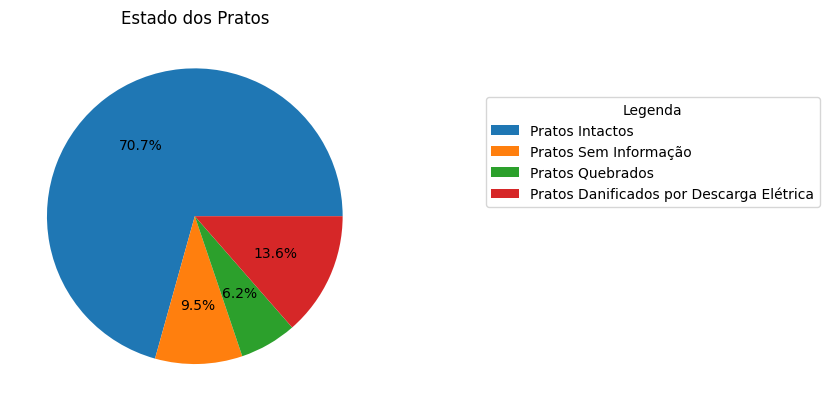

In [113]:
# Informacoes do gráfico
rotulos_grafico = ['Pratos Intactos', 'Pratos Sem Informação', 'Pratos Quebrados', 'Pratos Danificados por Descarga Elétrica']
valores_grafico = [contador_intacto + contador_resto, contador_no_info, contador_quebrado, contador_descarga_eletrica]

# Criacao do grafico
plt.title("Estado dos Pratos")
plt.pie(valores_grafico, autopct='%1.1f%%')
plt.legend(rotulos_grafico, title="Legenda", bbox_to_anchor=(1.5,0.5), loc="lower right", bbox_transform=plt.gcf().transFigure)
plt.show()

### 1.5. Manipulação das Imagens

#### Acesso e exibição de imagens no dataset. Nesta seção são utilizadas as coordenadas dispostas nos parâmetros **"bbox"**, que delimitam a região de cada prato do isolador. Assim, dependendo de sua condição, a região de destaque será representada por uma cor, sendo ela:

* **Cor Verde:** Prato Intacto
* **Cor Vermelha:** Prato Quebrado
* **Cor Azul:** Prato danificado por Descarga Elétrica

100228.JPG
C:\Projetos\TCC\1-Datasets\1-IEEE-Insulators\Train_IDID_V1.2\Train\Images\\
C:\Projetos\TCC\1-Datasets\1-IEEE-Insulators\Train_IDID_V1.2\Train\Images\\100228.JPG


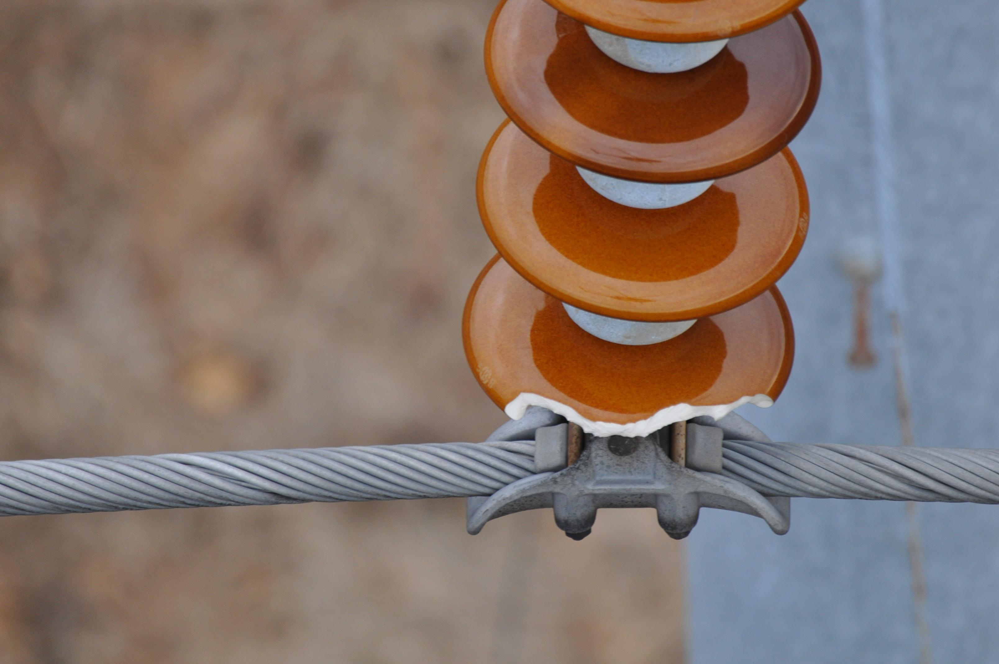

In [130]:
# Teste com a primeira imagem

nome_arquivo = df.iloc[0]['filename']
print(nome_arquivo)

caminho_base_imagens = r"C:\Projetos\TCC\1-Datasets\1-IEEE-Insulators\Train_IDID_V1.2\Train\Images\\"
print(caminho_base_imagens)

caminho_final = caminho_base_imagens + nome_arquivo
print(caminho_final)

img_teste = Image.open(caminho_final)
display(img_teste)

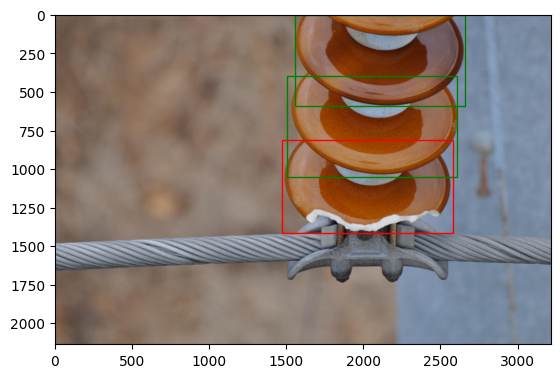

In [160]:
fig, ax = plt.subplots(1)
ax.imshow(img_teste)

regiao_1 = patches.Rectangle((1504, 399), 1104, 653, linewidth=1, edgecolor='g', facecolor='none')
ax.add_patch(regiao_1)

regiao_1 = patches.Rectangle((1471, 810), 1109, 606, linewidth=1, edgecolor='r', facecolor='none')
ax.add_patch(regiao_1)

#regiao_3 = patches.Rectangle((1434, 1), 1222, 1613, linewidth=1, edgecolor='y', facecolor='none')
#ax.add_patch(regiao_3)

regiao_1 = patches.Rectangle((1556, 0), 1105, 591, linewidth=1, edgecolor='g', facecolor='none')
ax.add_patch(regiao_1)

plt.show()

In [178]:
caminho_base_imagens = r"C:\Projetos\TCC\1-Datasets\1-IEEE-Insulators\Train_IDID_V1.2\Train\Images\\"
df.iloc[1]['filename']
caminho_final = caminho_base_imagens + nome_arquivo
print(caminho_final)

for objeto in df.iloc[1]['Labels']['objects']:
    print(objeto['bbox'])

C:\Projetos\TCC\1-Datasets\1-IEEE-Insulators\Train_IDID_V1.2\Train\Images\\100228.JPG
[607, 399, 1104, 653]
[635, 810, 1109, 606]
[559, 1, 1222, 1613]
[554, 0, 1105, 591]


### Identificação dos Discos

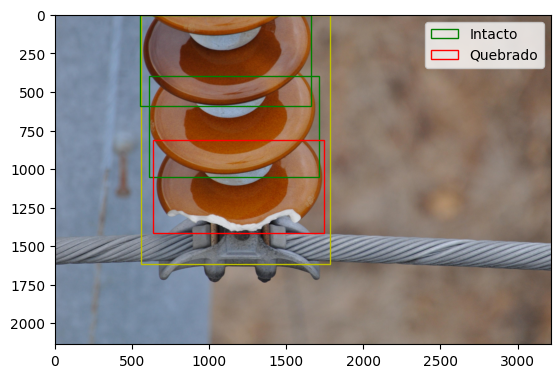

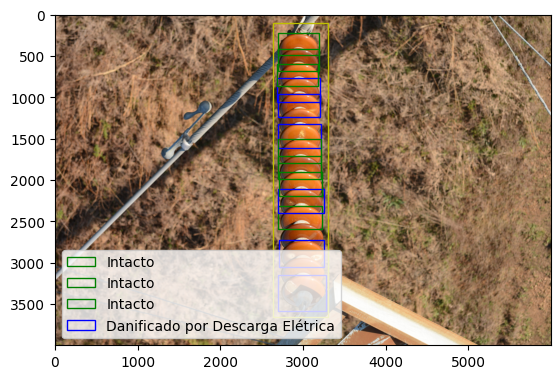

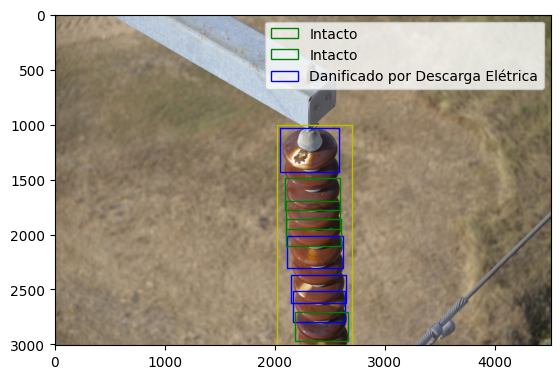

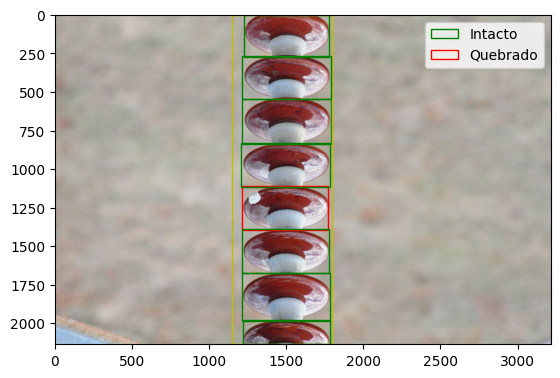

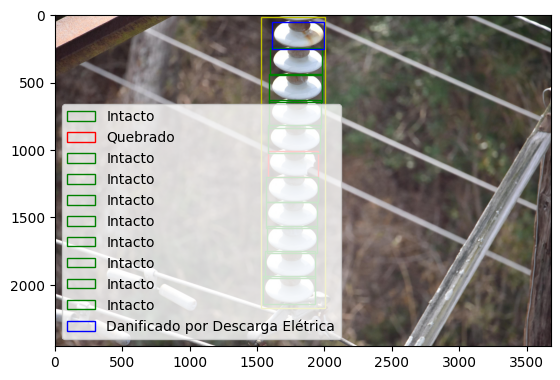

...

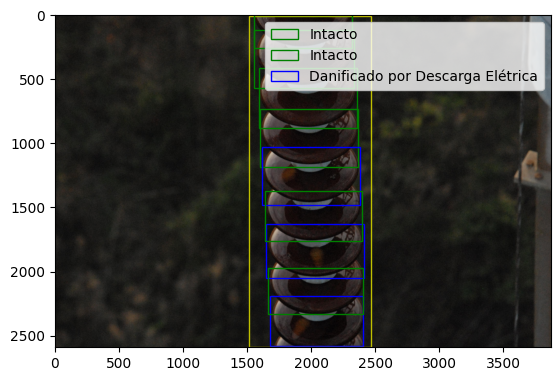

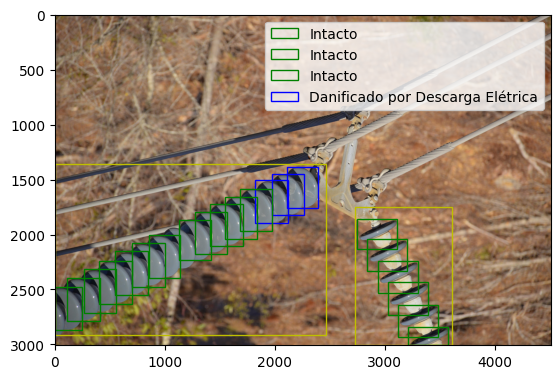

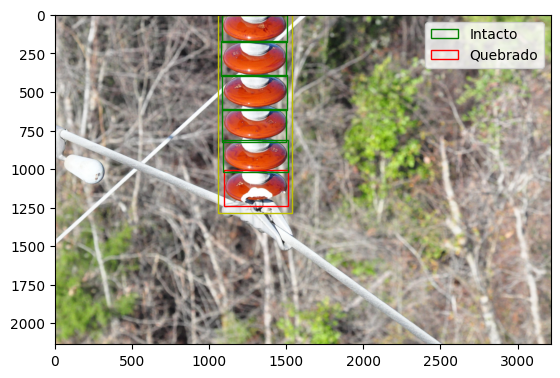

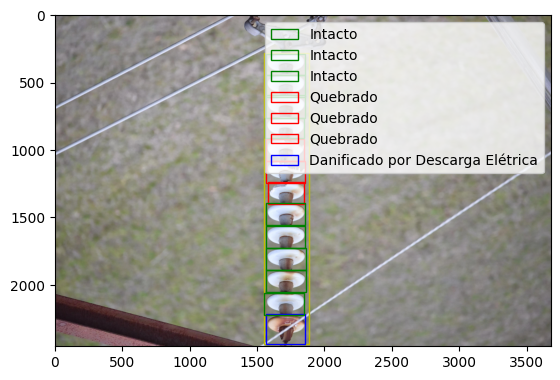

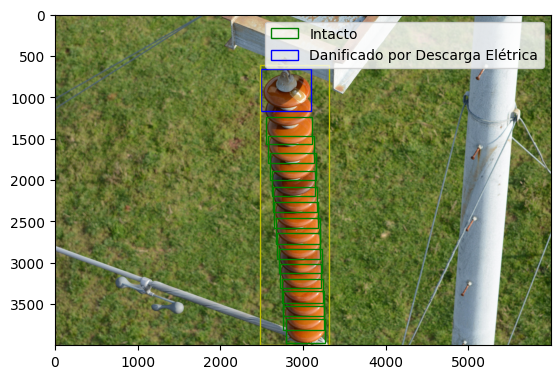

In [214]:
caminho_base_imagens = r"C:\Projetos\TCC\1-Datasets\1-IEEE-Insulators\Train_IDID_V1.2\Train\Images\\"

# Coordenadas da Imagem:
x_img = 0      # Pixel X do canto superior esquerdo da regiao
y_img = 0      # Pixel Y do canto superior esquerdo da regiao
w_img = 0      # Largura da regiao
h_img = 0      # Altura da regiao

# Sinalização de legenda das figuras plotadas
flag_reg_1 = 0
flag_reg_2 = 0
flag_reg_3 = 0

for isolador in range (1,110,10):
    nome_arquivo = df.iloc[isolador]['filename']
    
    # Montagem do caminho:
    caminho_final = caminho_base_imagens + nome_arquivo

    img_testada = Image.open(caminho_final)
    fig, ax = plt.subplots(1)
    ax.imshow(img_testada)
    
    #Analise de cada disco
    for objeto in df.iloc[isolador]['Labels']['objects']:
        if 'conditions' in objeto:
            # Disco sem defeito sera destacado de verde
            if (objeto['conditions'] == {"No issues": "No issues"}) or (objeto['conditions'] == {'notbroken-notflashed': 'notbroken-notflashed'}):
                #print(objeto['bbox'])
                x_img = objeto['bbox'][0]
                y_img = objeto['bbox'][1]
                w_img = objeto['bbox'][2]
                h_img = objeto['bbox'][3]
                flag_reg_1 += 1
                regiao_1 = patches.Rectangle((x_img, y_img), w_img, h_img, linewidth=1, edgecolor='g', facecolor='none', label='Intacto')
                ax.add_patch(regiao_1)
                # Coloca a legenda do tipo 1 apenas uma vez
                if flag_reg_1 == 1:
                    ax.legend()
                
            # Disco com quebra sera destacado de vermelho   
            elif(objeto['conditions'] == {'shell': 'Broken'}):
                #print(objeto['bbox'])
                x_img = objeto['bbox'][0]
                y_img = objeto['bbox'][1]
                w_img = objeto['bbox'][2]
                h_img = objeto['bbox'][3]
                flag_reg_2 += 1
                regiao_2 = patches.Rectangle((x_img, y_img), w_img, h_img, linewidth=1, edgecolor='r', facecolor='none', label='Quebrado')
                ax.add_patch(regiao_2)
                # Coloca a legenda do tipo 2 apenas uma vez
                if flag_reg_2 == 1:
                    ax.legend()
            # Disco com quebra sera destacado de vermelho    
            elif objeto['conditions'] == {'glaze': 'Flashover damage'}:
                #print(objeto['bbox'])
                x_img = objeto['bbox'][0]
                y_img = objeto['bbox'][1]
                w_img = objeto['bbox'][2]
                h_img = objeto['bbox'][3]
                flag_reg_3 += 1
                regiao_3 = patches.Rectangle((x_img, y_img), w_img, h_img, linewidth=1, edgecolor='b', facecolor='none', label='Danificado por Descarga Elétrica')
                ax.add_patch(regiao_3)
                # Coloca a legenda do tipo 3 apenas uma vez
                if flag_reg_3 == 1:
                    ax.legend()
                
            else:
                x_img = objeto['bbox'][0]
                y_img = objeto['bbox'][1]
                w_img = objeto['bbox'][2]
                h_img = objeto['bbox'][3]
                regiao_4 = patches.Rectangle((x_img, y_img), w_img, h_img, linewidth=1, edgecolor='y', facecolor='none')
                ax.add_patch(regiao_4)
                print('Faz nada!')
            
        elif 'conditions' not in objeto:
            #print("Condição não encontrada")
            x_img = objeto['bbox'][0]
            y_img = objeto['bbox'][1]
            w_img = objeto['bbox'][2]
            h_img = objeto['bbox'][3]
            regiao_4 = patches.Rectangle((x_img, y_img), w_img, h_img, linewidth=1, edgecolor='y', facecolor='none')
            ax.add_patch(regiao_4)
        else:
            print("Algo inesperado")
    flag_reg_1 = 0
    flag_reg_2 = 0
    flag_reg_3 = 0
    plt.show()